In [1]:
import glob
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import h5py
import tensorflow as tf
from imageio import imread
from PIL import Image
import os

from keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array, array_to_img
from keras.applications.vgg16 import preprocess_input
from sklearn.preprocessing import OneHotEncoder
%matplotlib inline

Using TensorFlow backend.


In [0]:
WIDTH=299
HEIGHT=299
BATCH_SIZE=30

In [4]:
enc = OneHotEncoder(sparse=False)
categories = np.array(['mountain','people','waterfall']).reshape(3,1)
enc.fit_transform(categories)

array([[1., 0., 0.],
       [0., 1., 0.],
       [0., 0., 1.]])

In [0]:
# Open the HDF5 file
file = h5py.File(r"/content/drive/My Drive/intel-image-classification/intel-image-classification/train_images_resampled_299_4.h5", "r+")
train_images = np.array(file["/images"]).astype("uint8")
train_labels = np.array(file["/meta"]).astype("str")
file = h5py.File(r"/content/drive/My Drive/intel-image-classification/intel-image-classification/validation_images_resampled_299_4.h5", "r+")
validation_images = np.array(file["/images"]).astype("uint8")
validation_labels = np.array(file["/meta"]).astype("str")

In [6]:
## Since the loaded train and validation datasets also had sea class labels and images, removing it from the dataset.
indx = np.where(train_labels!='sea')[0]
train_images = train_images[indx]
train_labels = train_labels[indx]
print(train_images.shape,train_labels.shape)
indx = np.where(validation_labels!='sea')[0]
validation_images = validation_images[indx]
validation_labels = validation_labels[indx]
print(validation_images.shape,validation_labels.shape)

(2708, 299, 299, 3) (2708,)
(679, 299, 299, 3) (679,)


In [0]:
## Encoding the class labels using one-hot encoder as this is a multi-class problem
train_labels = enc.transform(np.expand_dims(train_labels,1))
validation_labels = enc.transform(np.expand_dims(validation_labels,1))

In [8]:
#Train DataSet Generator with Augmentation
print("\nTraining Data Set")
train_generator = ImageDataGenerator(preprocessing_function=preprocess_input)
train_flow = train_generator.flow(
    train_images, train_labels,
    batch_size = BATCH_SIZE
)

#Validation DataSet Generator with Augmentation
print("\nValidation Data Set")
val_generator = ImageDataGenerator(preprocessing_function=preprocess_input)
val_flow = val_generator.flow(
    validation_images,validation_labels,
    batch_size = BATCH_SIZE
)


Training Data Set

Validation Data Set


In [0]:
from keras.models import Sequential, Model, load_model
from keras.callbacks import ModelCheckpoint, EarlyStopping, TensorBoard, CSVLogger
from keras import optimizers, models
from keras.layers import Dense, Dropout, GlobalAveragePooling2D
from keras import applications
from keras import backend as K
import tensorflow as tf
import os

NUM_PARALLEL_EXEC_UNITS = 8

#Set Performance Parameters for MKL and Tensorflow using Keras backend
#TensorFlow
config = tf.ConfigProto(
    intra_op_parallelism_threads=NUM_PARALLEL_EXEC_UNITS,
    inter_op_parallelism_threads=1
)

session = tf.Session(config=config)
K.set_session(session)

#MKL and OpenMP
os.environ["OMP_NUM_THREADS"] = str(NUM_PARALLEL_EXEC_UNITS)
os.environ["KMP_BLOCKTIME"] = "1"
os.environ["KMP_SETTINGS"] = "1"
os.environ["KMP_AFFINITY"]= "granularity=fine,verbose,compact,1,0"

In [10]:
# Initialize InceptionV3 with transfer learning
base_model = applications.vgg16.VGG16(weights='imagenet', 
                                include_top=False, 
                                input_shape=(WIDTH, HEIGHT,3))

# add a global spatial average pooling layer
x = base_model.output

x = GlobalAveragePooling2D()(x)
# and a dense layer
x = Dense(1024, activation='relu')(x)
predictions = Dense(len(categories), activation='softmax')(x)

# first: train only the top layers (which were randomly initialized)
# i.e. freeze all convolutional InceptionV3 layers
for layer in base_model.layers:
    layer.trainable = False


# this is the model we will train
model = Model(inputs=base_model.input, outputs=predictions)

# compile the model (should be done *after* setting layers to non-trainable)
model.compile(optimizer=optimizers.RMSprop(lr=1e-4), metrics=['accuracy'], loss='categorical_crossentropy')
model.summary()





58892288/58889256 [==============================] - 2s 0us/step



Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 299, 299, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 299, 299, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 299, 299, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 149, 149, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 149, 149, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 149, 149, 128)     147584    
_____________________________________________________

In [11]:
import math
top_layers_file_path=r"/content/drive/My Drive/intel-image-classification/intel-image-classification/top_layers.iv3.hdf5"

checkpoint = ModelCheckpoint(top_layers_file_path, monitor='loss', verbose=1, save_best_only=True, mode='min')
tb = TensorBoard(log_dir=r'/content/drive/My Drive/intel-image-classification/intel-image-classification/logs', batch_size=BATCH_SIZE, write_graph=True, update_freq='batch')
early = EarlyStopping(monitor="loss", mode="min", patience=5)
csv_logger = CSVLogger(r'/content/drive/My Drive/intel-image-classification/intel-image-classification/logs/iv3-log.csv', append=True)

history = model.fit_generator(train_flow, 
                              epochs=30, 
                              verbose=1,
                              validation_data=val_flow,
                              validation_steps=math.ceil(validation_images.shape[0]/BATCH_SIZE),
                              steps_per_epoch=math.ceil(train_images.shape[0]/BATCH_SIZE),
                              callbacks=[checkpoint, early, tb, csv_logger])

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Epoch 1/30
91/91 [==============================] - 43s 470ms/step - loss: 0.3397 - acc: 0.8684 - val_loss: 0.2920 - val_acc: 0.9013

Epoch 00001: loss improved from inf to 0.33760, saving model to /content/drive/My Drive/intel-image-classification/intel-image-classification/top_layers.iv3.hdf5
Epoch 2/30
91/91 [==============================] - 32s 354ms/step - loss: 0.1878 - acc: 0.9352 - val_loss: 0.2415 - val_acc: 0.9175

Epoch 00002: loss improved from 0.33760 to 0.18928, saving model to /content/drive/My Drive/intel-image-classification/intel-image-classification/top_layers.iv3.hdf5
Epoch 3/30
91/91 [==============================] - 35s 381ms/step - loss: 0.1397 - acc: 0.9516 - val_loss: 0.2406 - val_acc: 0.9161

Epoch 00003: loss improved from 0.18928 to 0.14031, saving model to /content/drive/My Drive/intel-image-classification/intel-image-classification/top_layers.iv3.hdf5
Epoch 4/

In [12]:
import math
import numpy as np
predictions = model.predict_generator(
    train_flow,
    verbose=1,
    steps=math.ceil(train_images.shape[0]/BATCH_SIZE))
predicted_classes = [x[0] for x in enc.inverse_transform(predictions)]
true_classes = [x[0] for x in enc.inverse_transform(train_labels)]

91/91 [==============================] - 27s 302ms/step


In [23]:
predictions

array([[1.6578229e-05, 3.4844311e-07, 9.9998307e-01],
       [2.4442274e-32, 1.0000000e+00, 2.2556006e-21],
       [8.6774001e-09, 3.0472172e-12, 1.0000000e+00],
       ...,
       [9.9972671e-01, 2.2792698e-07, 2.7298639e-04],
       [3.4264356e-32, 1.0000000e+00, 3.8858144e-33],
       [9.9157614e-01, 2.3878309e-08, 8.4239086e-03]], dtype=float32)

In [14]:
import matplotlib.pyplot as plt
%matplotlib inline  
import scikitplot as skplt
import sklearn

sklearn.metrics.confusion_matrix(
    true_classes, 
    predicted_classes,
    labels=['mountain','people','waterfall'],
    )

array([[303, 295, 314],
       [330, 297, 289],
       [280, 325, 275]])

In [0]:
from sklearn.metrics import accuracy

accuracy(y_true = true_classes,y_pred = predicted_classes)

In [0]:
# This function plots sample images in specified size and in defined grid
def plot_batch(images,labels, grid_width, grid_height, im_scale_x, im_scale_y):
    f, ax = plt.subplots(grid_width, grid_height)
    f.set_size_inches(15, 60)
    
    img_idx = 0
    for i in range(0, grid_width):
        for j in range(0, grid_height):
            ax[i][j].axis('off')
            ax[i][j].set_title(str(img_idx) + ". " + labels[img_idx])
            ax[i][j].imshow(array_to_img(images[img_idx]))
            img_idx += 1
            
    plt.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=0, hspace=0.25)

In [0]:
true_classes

['mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',
 'mountain',

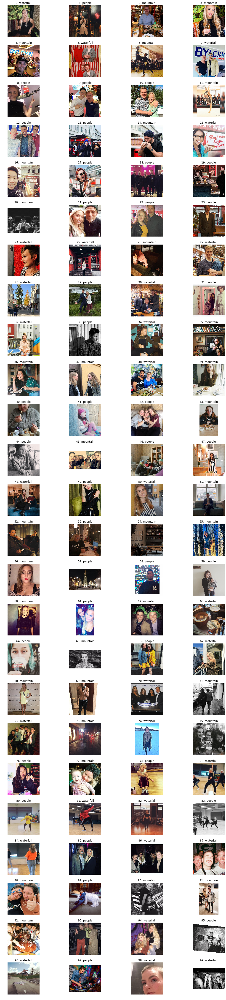

In [0]:
# load dataset and visualize sample data
plot_batch(train_images[1200:1300],predicted_classes[1200:1300], grid_width=25, grid_height=4,
           im_scale_x=299, im_scale_y=299)

In [0]:
instagram_images = []
instagram_loc = r"C:\Users\bg532fh\Documents\Personal\Kaggle\Vacation Destination\intel-image-classification\test_instagram\\"
for file in os.listdir(instagram_loc):
    im1 = Image.open(instagram_loc+file)
    im2 = im1.resize((150, 150), Image.NEAREST)
    test_image = np.array(im2)
    instagram_images.append(test_image)

FileNotFoundError: ignored

In [0]:
instagram_images = np.array(instagram_images)

In [0]:
predictions_enc = model.predict(instagram_images)
predictions_unenc = enc.inverse_transform(predictions_enc)

In [0]:
predictions_unenc

array([['waterfall'],
       ['mountain'],
       ['waterfall'],
       ...,
       ['mountain'],
       ['waterfall'],
       ['mountain']], dtype='<U15')

In [0]:
# This function plots sample images in specified size and in defined grid
def plot_batch(images,labels, grid_width, grid_height, im_scale_x, im_scale_y):
    f, ax = plt.subplots(grid_width, grid_height)
    f.set_size_inches(15, 60)
    
    img_idx = 0
    for i in range(0, grid_width):
        for j in range(0, grid_height):
            ax[i][j].axis('off')
            ax[i][j].set_title(str(img_idx) + ". " + labels[img_idx][0])
            ax[i][j].imshow(array_to_img(images[img_idx]))
            img_idx += 1
            
    plt.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=0, hspace=0.25)

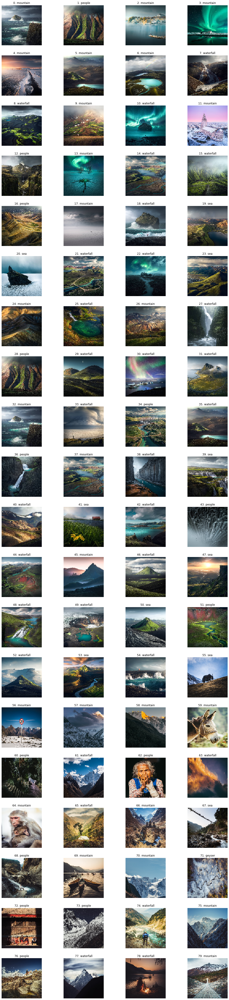

In [0]:
# load dataset and visualize sample data
plot_batch(instagram_images[100:200],predictions_unenc[100:200], grid_width=20, grid_height=4,
           im_scale_x=64, im_scale_y=64)